In [215]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',100)

In [216]:
data=pd.read_csv("Myntra Fasion Clothing.csv")
data

,URL,Product_id,BrandName,Category,Individual_category,category_by_Gender,Description,DiscountPrice (in Rs),OriginalPrice (in Rs),DiscountOffer,SizeOption,Ratings,Reviews
0,https://www.myntra.com/jeans/roadster/roadster...,2296012,Roadster,Bottom Wear,jeans,Men,roadster men navy blue slim fit mid rise clean...,824.0,1499.0,45% OFF,"28, 30, 32, 34, 36",3.9,999.0
1,https://www.myntra.com/track-pants/locomotive/...,13780156,LOCOMOTIVE,Bottom Wear,track-pants,Men,locomotive men black white solid slim fit tra...,517.0,1149.0,55% OFF,"S, M, L, XL",4.0,999.0
2,https://www.myntra.com/shirts/roadster/roadste...,11895958,Roadster,Topwear,shirts,Men,roadster men navy white black geometric print...,629.0,1399.0,55% OFF,"38, 40, 42, 44, 46, 48",4.3,999.0
3,https://www.myntra.com/shapewear/zivame/zivame...,4335679,Zivame,Lingerie & Sleep Wear,shapewear,Women,zivame women black saree shapewear zi3023core0...,893.0,1295.0,31% OFF,"S, M, L, XL, XXL",4.2,999.0
4,https://www.myntra.com/tshirts/roadster/roadst...,11690882,Roadster,Western,tshirts,Women,roadster women white solid v neck pure cotton ...,NaN,599.0,35% OFF,"XS, S, M, L, XL",4.2,999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
526559,https://www.myntra.com/sweaters/hm/hm-women-be...,16929990,H&M,Western,sweaters,Women,hm women beige oversized cashmere jumper,NaN,9999.0,NaN,"XS, S, M, L",NaN,NaN
526560,https://www.myntra.com/jackets/hm/hm-women-bla...,16026012,H&M,Western,jackets,Women,hm women black water repellent parka jacket,NaN,9999.0,NaN,"XS, S, M, L, XL",NaN,NaN
526561,https://www.myntra.com/dresses/250-designs/250...,17654114,250 DESIGNS,Western,dresses,Women,250 designs blue lace sheath dress,NaN,9999.0,NaN,"S, M, L, XL, XXL",NaN,NaN
526562,https://www.myntra.com/dresses/masaba/masaba-w...,12508700,Masaba,Western,dresses,Women,masaba women yellow printed a line dress,NaN,9999.0,NaN,"XS, S, M, L, XL",NaN,NaN


In [217]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526564 entries, 0 to 526563
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   URL                    526564 non-null  object 
 1   Product_id             526564 non-null  int64  
 2   BrandName              526564 non-null  object 
 3   Category               526564 non-null  object 
 4   Individual_category    526564 non-null  object 
 5   category_by_Gender     526564 non-null  object 
 6   Description            526564 non-null  object 
 7   DiscountPrice (in Rs)  333406 non-null  float64
 8   OriginalPrice (in Rs)  526564 non-null  float64
 9   DiscountOffer          452258 non-null  object 
 10  SizeOption             526564 non-null  object 
 11  Ratings                190412 non-null  float64
 12  Reviews                190412 non-null  float64
dtypes: float64(4), int64(1), object(8)
memory usage: 52.2+ MB


In [218]:
data.columns

Index(['URL', 'Product_id', 'BrandName', 'Category', 'Individual_category',
       'category_by_Gender', 'Description', 'DiscountPrice (in Rs)',
       'OriginalPrice (in Rs)', 'DiscountOffer', 'SizeOption', 'Ratings',
       'Reviews'],
      dtype='object')

In [219]:
data[['Discount','off']]=data['DiscountOffer'].str.split('%',expand=True)
data.head()

,URL,Product_id,BrandName,Category,Individual_category,category_by_Gender,Description,DiscountPrice (in Rs),OriginalPrice (in Rs),DiscountOffer,SizeOption,Ratings,Reviews,Discount,off
0,https://www.myntra.com/jeans/roadster/roadster...,2296012,Roadster,Bottom Wear,jeans,Men,roadster men navy blue slim fit mid rise clean...,824.0,1499.0,45% OFF,"28, 30, 32, 34, 36",3.9,999.0,45,OFF
1,https://www.myntra.com/track-pants/locomotive/...,13780156,LOCOMOTIVE,Bottom Wear,track-pants,Men,locomotive men black white solid slim fit tra...,517.0,1149.0,55% OFF,"S, M, L, XL",4.0,999.0,55,OFF
2,https://www.myntra.com/shirts/roadster/roadste...,11895958,Roadster,Topwear,shirts,Men,roadster men navy white black geometric print...,629.0,1399.0,55% OFF,"38, 40, 42, 44, 46, 48",4.3,999.0,55,OFF
3,https://www.myntra.com/shapewear/zivame/zivame...,4335679,Zivame,Lingerie & Sleep Wear,shapewear,Women,zivame women black saree shapewear zi3023core0...,893.0,1295.0,31% OFF,"S, M, L, XL, XXL",4.2,999.0,31,OFF
4,https://www.myntra.com/tshirts/roadster/roadst...,11690882,Roadster,Western,tshirts,Women,roadster women white solid v neck pure cotton ...,NaN,599.0,35% OFF,"XS, S, M, L, XL",4.2,999.0,35,OFF


In [220]:
data.drop(['DiscountOffer','off'],inplace=True,axis=1)
data.head()

,URL,Product_id,BrandName,Category,Individual_category,category_by_Gender,Description,DiscountPrice (in Rs),OriginalPrice (in Rs),SizeOption,Ratings,Reviews,Discount
0,https://www.myntra.com/jeans/roadster/roadster...,2296012,Roadster,Bottom Wear,jeans,Men,roadster men navy blue slim fit mid rise clean...,824.0,1499.0,"28, 30, 32, 34, 36",3.9,999.0,45
1,https://www.myntra.com/track-pants/locomotive/...,13780156,LOCOMOTIVE,Bottom Wear,track-pants,Men,locomotive men black white solid slim fit tra...,517.0,1149.0,"S, M, L, XL",4.0,999.0,55
2,https://www.myntra.com/shirts/roadster/roadste...,11895958,Roadster,Topwear,shirts,Men,roadster men navy white black geometric print...,629.0,1399.0,"38, 40, 42, 44, 46, 48",4.3,999.0,55
3,https://www.myntra.com/shapewear/zivame/zivame...,4335679,Zivame,Lingerie & Sleep Wear,shapewear,Women,zivame women black saree shapewear zi3023core0...,893.0,1295.0,"S, M, L, XL, XXL",4.2,999.0,31
4,https://www.myntra.com/tshirts/roadster/roadst...,11690882,Roadster,Western,tshirts,Women,roadster women white solid v neck pure cotton ...,NaN,599.0,"XS, S, M, L, XL",4.2,999.0,35


In [221]:
data.isnull().sum()

URL                           0
Product_id                    0
BrandName                     0
Category                      0
Individual_category           0
category_by_Gender            0
Description                   0
DiscountPrice (in Rs)    193158
OriginalPrice (in Rs)         0
SizeOption                    0
Ratings                  336152
Reviews                  336152
Discount                  74306
dtype: int64

In [222]:
data[data.Discount.isnull()]

,URL,Product_id,BrandName,Category,Individual_category,category_by_Gender,Description,DiscountPrice (in Rs),OriginalPrice (in Rs),SizeOption,Ratings,Reviews,Discount
8,https://www.myntra.com/tshirts/roadster/roadst...,17381394,Roadster,Western,tshirts,Women,roadster women pack of 2 solid t shirts,NaN,1098.0,"XS, S, M, L, XL",4.3,997.0,NaN
9,https://www.myntra.com/jeans/herenow/herenow-m...,2359257,HERE&NOW,Bottom Wear,jeans,Men,herenow men blue slim fit mid rise clean look ...,NaN,2749.0,"28, 30, 32, 34, 36",3.5,996.0,NaN
11,https://www.myntra.com/tshirts/roadster/roadst...,10307375,Roadster,Topwear,tshirts,Men,roadster men navy blue white striped polo col...,NaN,699.0,"XS, S, M, L, XL, XXL, 3XL, 4XL",4.1,996.0,NaN
17,https://www.myntra.com/kurta-sets/sangria/sang...,10561392,Sangria,Plus Size,kurta-sets,Women,sangria women green off white printed kurta w...,NaN,3999.0,"XS, S, M, L, XL, XXL, 3XL",4.3,995.0,NaN
20,https://www.myntra.com/tshirts/roadster/roadst...,17385142,Roadster,Western,tshirts,Women,roadster women pack of 2 printed cotton t shirt,NaN,1298.0,"XS, S, M, L, XL",4.4,994.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
526559,https://www.myntra.com/sweaters/hm/hm-women-be...,16929990,H&M,Western,sweaters,Women,hm women beige oversized cashmere jumper,NaN,9999.0,"XS, S, M, L",NaN,NaN,NaN
526560,https://www.myntra.com/jackets/hm/hm-women-bla...,16026012,H&M,Western,jackets,Women,hm women black water repellent parka jacket,NaN,9999.0,"XS, S, M, L, XL",NaN,NaN,NaN
526561,https://www.myntra.com/dresses/250-designs/250...,17654114,250 DESIGNS,Western,dresses,Women,250 designs blue lace sheath dress,NaN,9999.0,"S, M, L, XL, XXL",NaN,NaN,NaN
526562,https://www.myntra.com/dresses/masaba/masaba-w...,12508700,Masaba,Western,dresses,Women,masaba women yellow printed a line dress,NaN,9999.0,"XS, S, M, L, XL",NaN,NaN,NaN


There are missing values in Column, DiscountPrice and is related to Discount column

In [223]:
#Fetching index where discount values are null
c=list(data[data.Discount.isnull()].index) 

In [224]:
#Dropping rows where discount values are null where size of data is very high it may not be a peoblem for future analysis
data.drop(c,inplace=True)
data.isnull().sum()

URL                           0
Product_id                    0
BrandName                     0
Category                      0
Individual_category           0
category_by_Gender            0
Description                   0
DiscountPrice (in Rs)    119036
OriginalPrice (in Rs)         0
SizeOption                    0
Ratings                  281234
Reviews                  281234
Discount                      0
dtype: int64

In [225]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 452258 entries, 0 to 510812
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   URL                    452258 non-null  object 
 1   Product_id             452258 non-null  int64  
 2   BrandName              452258 non-null  object 
 3   Category               452258 non-null  object 
 4   Individual_category    452258 non-null  object 
 5   category_by_Gender     452258 non-null  object 
 6   Description            452258 non-null  object 
 7   DiscountPrice (in Rs)  333222 non-null  float64
 8   OriginalPrice (in Rs)  452258 non-null  float64
 9   SizeOption             452258 non-null  object 
 10  Ratings                171024 non-null  float64
 11  Reviews                171024 non-null  float64
 12  Discount               452258 non-null  object 
dtypes: float64(4), int64(1), object(8)
memory usage: 48.3+ MB


In [226]:
data.columns

Index(['URL', 'Product_id', 'BrandName', 'Category', 'Individual_category',
       'category_by_Gender', 'Description', 'DiscountPrice (in Rs)',
       'OriginalPrice (in Rs)', 'SizeOption', 'Ratings', 'Reviews',
       'Discount'],
      dtype='object')

In [227]:
data.shape

(452258, 13)

In [228]:
data.sample(10)

,URL,Product_id,BrandName,Category,Individual_category,category_by_Gender,Description,DiscountPrice (in Rs),OriginalPrice (in Rs),SizeOption,Ratings,Reviews,Discount
254349,https://www.myntra.com/jackets/puma/puma-men-b...,15688124,Puma,Sports Wear,jackets,Men,puma men blue outdoor padded jacket,3999.0,7999.0,"XS, S, M, L, XL, XXL",NaN,NaN,50
91997,https://www.myntra.com/dresses/yash-gallery/ya...,13404952,YASH GALLERY,Western,dresses,Women,yash gallery women black beige printed a line...,NaN,2399.0,"XS, S, M, L, XL, XXL",4.1,20.0,71
224002,https://www.myntra.com/kurta-sets/jompers/jomp...,16648188,Jompers,Indian Wear,kurta-sets,Men,jompers men olive green pure cotton kurta with...,839.0,1999.0,"S, M, L, XL, XXL",NaN,NaN,58
506740,https://www.myntra.com/tops/dipsha/dipsha-blac...,17760194,Dipsha,Western,tops,Women,dipsha black cottoncrop top,NaN,899.0,"XS, S, M, L, XL, XXL",NaN,NaN,57
481174,https://www.myntra.com/blazers/oxolloxo/oxollo...,15564782,Oxolloxo,Western,blazers,Women,oxolloxo women black printed single breasted b...,NaN,2399.0,"S, M, L, XL",NaN,NaN,60
461978,https://www.myntra.com/dresses/the-nks-plus/th...,16172268,THE NKS PLUS,Western,dresses,Women,the nks plus orange cotton floral a line midi ...,NaN,1699.0,"S, M, L, XL, XXL",NaN,NaN,62
67882,https://www.myntra.com/trousers/hancock/hancoc...,10128137,Hancock,Bottom Wear,trousers,Men,hancock men grey slim fit checked formal trousers,1119.0,2799.0,"30, 32, 34, 36, 38",4.1,32.0,60
341079,https://www.myntra.com/sarees/pothys/pothys-bl...,18294458,Pothys,Indian Wear,sarees,Women,pothys blue gold toned floral art silk saree,1820.0,2600.0,Onesize,NaN,NaN,30
700,https://www.myntra.com/jeans/tokyo-talkies/tok...,11538394,Tokyo Talkies,Western,jeans,Women,tokyo talkies women white bootcut mid rise cle...,NaN,1899.0,"26, 28, 30, 32, 34",4.2,873.0,48
431945,https://www.myntra.com/briefs/skidlers/skidler...,12804938,Skidlers,Lingerie & Sleep Wear,briefs,Women,skidlers women pack of 3 assorted hipster brie...,345.0,899.0,"S, M, L, XL, XXL",NaN,NaN,Rs. 554 OFF


In [229]:
#The Discount values have unwanted spaces at the begining and end,it should be removed
data['Discount']=data['Discount'].str.strip(' ')

In [230]:
#In Discount columns,instead for discount percentage,discount price is explicitely given.it should be removed
c=np.where(data.Discount.str.isnumeric(),False,True)

In [231]:
x=list(data[c].index)
data.drop(x,inplace=True)

In [232]:
data.isnull().sum()

URL                           0
Product_id                    0
BrandName                     0
Category                      0
Individual_category           0
category_by_Gender            0
Description                   0
DiscountPrice (in Rs)    112225
OriginalPrice (in Rs)         0
SizeOption                    0
Ratings                  267265
Reviews                  267265
Discount                      0
dtype: int64

In [233]:
data['Discount']=data['Discount'].astype('float64')

In [234]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 432814 entries, 0 to 510812
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   URL                    432814 non-null  object 
 1   Product_id             432814 non-null  int64  
 2   BrandName              432814 non-null  object 
 3   Category               432814 non-null  object 
 4   Individual_category    432814 non-null  object 
 5   category_by_Gender     432814 non-null  object 
 6   Description            432814 non-null  object 
 7   DiscountPrice (in Rs)  320589 non-null  float64
 8   OriginalPrice (in Rs)  432814 non-null  float64
 9   SizeOption             432814 non-null  object 
 10  Ratings                165549 non-null  float64
 11  Reviews                165549 non-null  float64
 12  Discount               432814 non-null  float64
dtypes: float64(5), int64(1), object(7)
memory usage: 46.2+ MB


In [235]:
#Renaming the columns 'DiscountPrice (in Rs)' and 'OriginalPrice (in Rs)'
data.rename(columns={'DiscountPrice (in Rs)':'DiscountPrice','OriginalPrice (in Rs)':'OriginalPrice'},inplace=True) 

In [236]:
#Replacing Nan values in the 'DiscountPrice' column 
data['DiscountPrice']=round((data.OriginalPrice*data.Discount)/100,0)

In [237]:
data.isnull().sum()

URL                         0
Product_id                  0
BrandName                   0
Category                    0
Individual_category         0
category_by_Gender          0
Description                 0
DiscountPrice               0
OriginalPrice               0
SizeOption                  0
Ratings                267265
Reviews                267265
Discount                    0
dtype: int64

In [238]:
#Calculate unique elements in column Ratings
data.Reviews.nunique()

996

In [239]:
# returns a numpy array containing all the unique values present in ratings column
data.Ratings.unique()

array([3.9, 4. , 4.3, 4.2, 4.4, 3.7, 4.1, 3.8, 3.6, 4.5, 3.4, 3.5, 4.6,
       3.2, 3.3, 3. , 3.1, 2.9, 2.8, 4.7, 2.6, 2.5, 2.4, 2. , 2.7, 4.8,
       2.3, 4.9, 1.6, 2.2, 2.1, 1.8, 5. , 1.2, 1.9, 1.7, 1.4, 1.5, 1.1,
       1. , 1.3, nan])

In [240]:
#Replacing Nan values in Rating column with zero
data.Ratings=np.where(data.Ratings.isnull(),0,data.Ratings)

In [241]:
##Replacing Nan values in Reviews column with zero
data.Reviews=np.where(data.Reviews.isnull(),0,data.Reviews)

In [242]:
data.drop(['SizeOption','URL','Product_id','Description'],inplace=True,axis=1)

In [243]:
data.isnull().sum()

BrandName              0
Category               0
Individual_category    0
category_by_Gender     0
DiscountPrice          0
OriginalPrice          0
Ratings                0
Reviews                0
Discount               0
dtype: int64

In [244]:
data.shape

(432814, 9)

In [245]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 432814 entries, 0 to 510812
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   BrandName            432814 non-null  object 
 1   Category             432814 non-null  object 
 2   Individual_category  432814 non-null  object 
 3   category_by_Gender   432814 non-null  object 
 4   DiscountPrice        432814 non-null  float64
 5   OriginalPrice        432814 non-null  float64
 6   Ratings              432814 non-null  float64
 7   Reviews              432814 non-null  float64
 8   Discount             432814 non-null  float64
dtypes: float64(5), object(4)
memory usage: 33.0+ MB


In [246]:
data.rename(columns={'category_by_Gender':'sex'},inplace=True)

In [247]:
cat_fea=[i for i in data.columns if data[i].dtype=='O']
cat_fea

['BrandName', 'Category', 'Individual_category', 'sex']

In [248]:
for i in cat_fea:
    print('{} has {} no of unique_values'.format(i,data[i].nunique()))
    

BrandName has 1659 no of unique_values
Category has 8 no of unique_values
Individual_category has 89 no of unique_values
sex has 2 no of unique_values


In [249]:
data.head()

,BrandName,Category,Individual_category,sex,DiscountPrice,OriginalPrice,Ratings,Reviews,Discount
0,Roadster,Bottom Wear,jeans,Men,675.0,1499.0,3.9,999.0,45.0
1,LOCOMOTIVE,Bottom Wear,track-pants,Men,632.0,1149.0,4.0,999.0,55.0
2,Roadster,Topwear,shirts,Men,769.0,1399.0,4.3,999.0,55.0
3,Zivame,Lingerie & Sleep Wear,shapewear,Women,401.0,1295.0,4.2,999.0,31.0
4,Roadster,Western,tshirts,Women,210.0,599.0,4.2,999.0,35.0


In [250]:
data.groupby(['BrandName'])['Category'].count().sort_values(ascending=False)[:20]

BrandName
Pothys                   15572
Roadster                  9541
KALINI                    9070
HERE&NOW                  6335
Ethnic basket             4758
Mast & Harbour            4652
HRX by Hrithik Roshan     4603
Friskers                  4513
Mitera                    4455
DressBerry                4330
Sangria                   4255
Puma                      4237
SOJANYA                   4123
URBANIC                   4058
Anouk                     3824
DEYANN                    3750
Clovia                    3156
Kanvin                    3049
VIMAL JONNEY              2962
Tokyo Talkies             2802
Name: Category, dtype: int64

In [251]:
c=data['BrandName'].value_counts().reset_index()[:20]
c

,index,BrandName
0,Pothys,15572
1,Roadster,9541
2,KALINI,9070
3,HERE&NOW,6335
4,Ethnic basket,4758
5,Mast & Harbour,4652
6,HRX by Hrithik Roshan,4603
7,Friskers,4513
8,Mitera,4455
9,DressBerry,4330


In [252]:
c.rename(columns={'index':'BrandName','BrandName':'Count'},inplace=True)

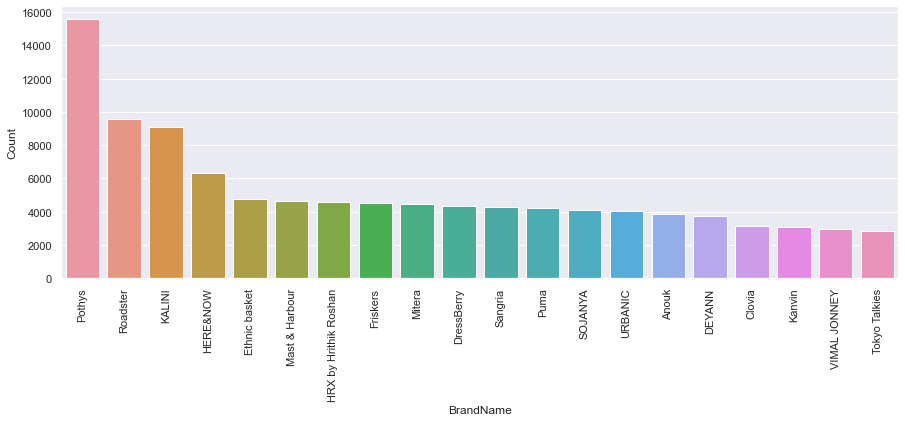

In [253]:
plt.figure(figsize=(15,5))
sns.barplot(data=c,x='BrandName',y='Count');
plt.xticks(rotation=90);

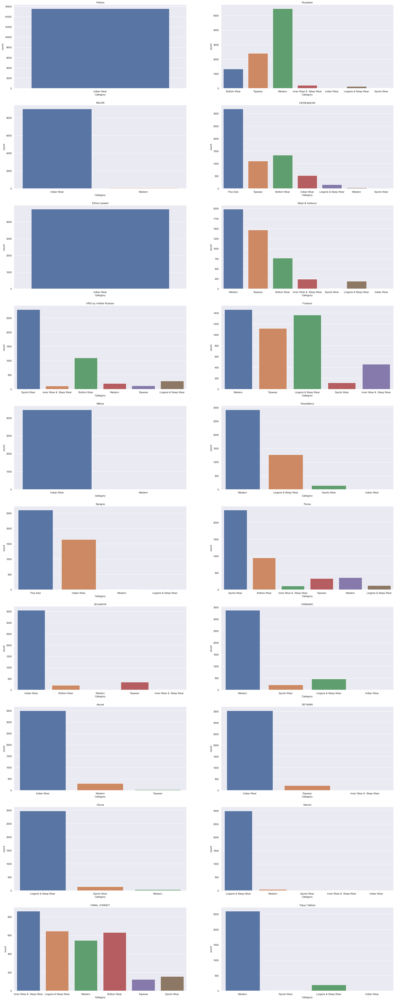

In [254]:
#Visualization of category count for Brands with most number of items
z=1
plt.figure(figsize=(30,80))
for i in c.BrandName:
    x=data[data.BrandName==i]
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,10)})
    plt.title(i)
    sns.countplot(data=x,x='Category')
    z+=1

1.Pothys,Kalini,Ethnic_basket,Mitera,Anouk,Deyann and sojanya focus on indian wears
2.Roadster,Mast&Harbour,Friskers,Dressberry,Tokyo and Talkies mainly focus on western wears
3.Puma and HRX foucses on sports wear

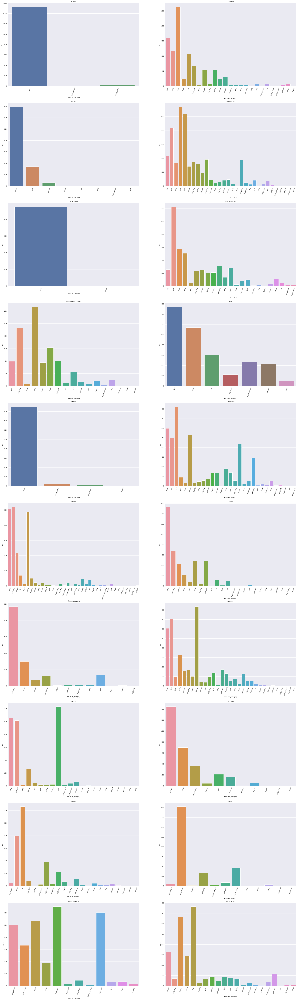

In [255]:
#Count on Individual Categories in  each brands
z=1
plt.figure(figsize=(40,140))
for i in c.BrandName:
    x=data[data.BrandName==i]
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,40)})
    plt.title(i)
    sns.countplot(data=x,x='Individual_category')
    plt.xticks(rotation=70)
    z+=1


1.Pothys ,Kalini ,Mitera,Anouk where main category is indian wears and are mainly focused on sarees

2.Roadster,Mast&Harbour,Friskers ,Dressberry,Tokyo and Talkies focussed on wide range of products

3.HRX and Puma mainly focused on Tshirts and Track Pants

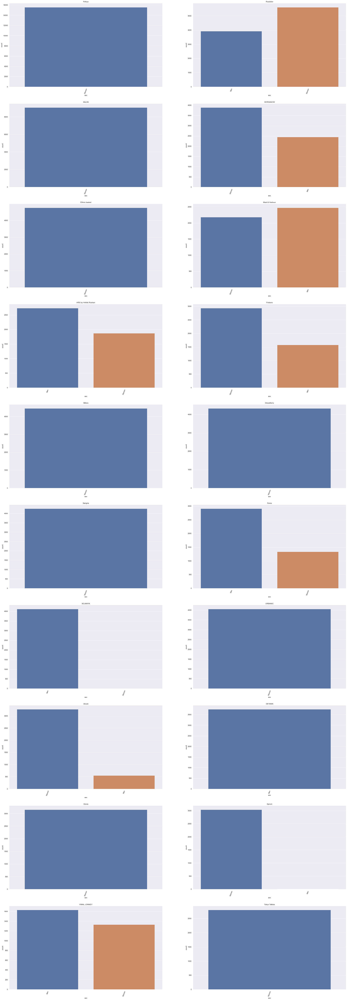

In [256]:
#Gender wise count for each brand
z=1
plt.figure(figsize=(40,120))
for i in c.BrandName:
    x=data[data.BrandName==i]
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,40)})
    plt.title(i)
    sns.countplot(data=x,x='sex')
    plt.xticks(rotation=70)
    z+=1

1.From The above plotes based on gender,We can see that most of the companies focus on women 

2.Sport Brands like Puma and HRX focuses mainly on men

## Univariate Analysis of Numerical Features

In [257]:
num_fea=[i for i in data.columns if data[i].dtype !='0']

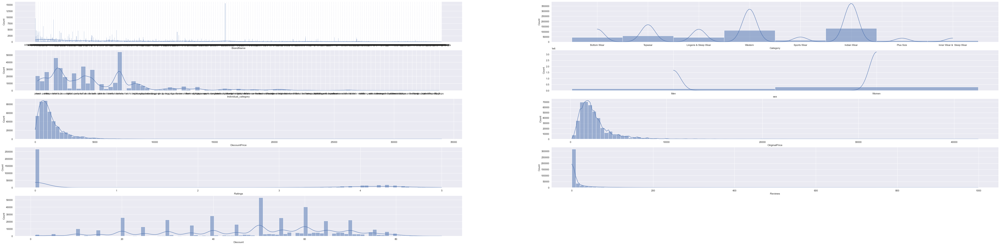

In [258]:

z=1
plt.figure(figsize=(80,40))
for i in num_fea:
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,10)})
    sns.histplot(data=data,x=i,kde=True,bins=100)
    z+=1

In [259]:
data.groupby(['BrandName','Individual_category'])['DiscountPrice'].mean()

BrandName       Individual_category
1 Stop Fashion  kurtas                 2259.884921
109F            dresses                1079.411765
                jackets                1000.000000
                jeans                  1184.750000
                kurtas                 1199.000000
                                          ...     
zebu            sweatshirts             869.000000
                tights                  824.000000
                tops                    479.800000
                track-pants             824.000000
                tshirts                 560.444444
Name: DiscountPrice, Length: 9511, dtype: float64

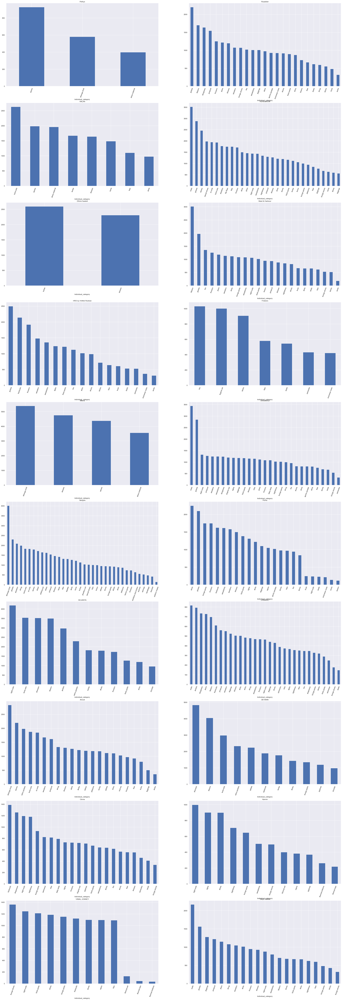

In [260]:
#Average discount price on each of the products in individual Category
z=1
plt.figure(figsize=(40,120))
for i in c.BrandName:
    x=data[data.BrandName==i]
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,40)})
    plt.title(i)
    x.groupby(['Individual_category'])['DiscountPrice'].mean().sort_values(ascending=False).plot.bar()
    plt.xticks(rotation=70)
    z+=1

In [261]:
#New columns for Discount amount for each of the products
data['Discount_amount']=data['OriginalPrice']-data['DiscountPrice']
data.head()

,BrandName,Category,Individual_category,sex,DiscountPrice,OriginalPrice,Ratings,Reviews,Discount,Discount_amount
0,Roadster,Bottom Wear,jeans,Men,675.0,1499.0,3.9,999.0,45.0,824.0
1,LOCOMOTIVE,Bottom Wear,track-pants,Men,632.0,1149.0,4.0,999.0,55.0,517.0
2,Roadster,Topwear,shirts,Men,769.0,1399.0,4.3,999.0,55.0,630.0
3,Zivame,Lingerie & Sleep Wear,shapewear,Women,401.0,1295.0,4.2,999.0,31.0,894.0
4,Roadster,Western,tshirts,Women,210.0,599.0,4.2,999.0,35.0,389.0


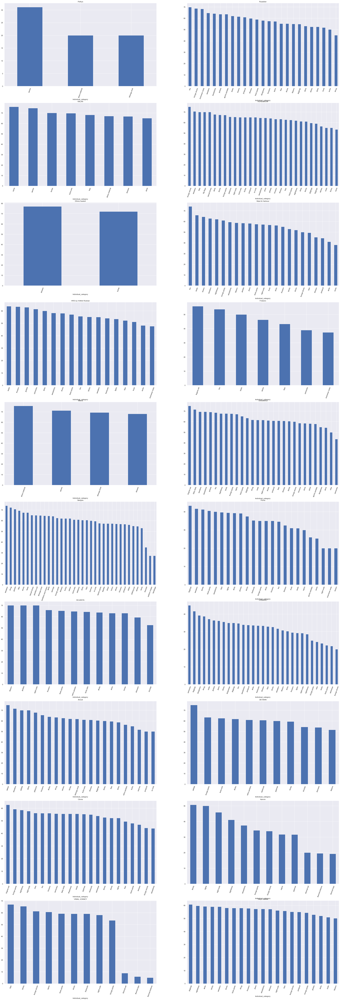

In [262]:
#Discounts provided by each of the company on their products--Almost all the companies provide 50% OFF on their products
z=1
plt.figure(figsize=(40,120))
for i in c.BrandName:
    x=data[data.BrandName==i]
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,40)})
    plt.title(i)
    x.groupby(['Individual_category'])['Discount'].mean().sort_values(ascending=False).plot.bar()
    plt.xticks(rotation=70)
    z+=1

In [263]:
data.head()

,BrandName,Category,Individual_category,sex,DiscountPrice,OriginalPrice,Ratings,Reviews,Discount,Discount_amount
0,Roadster,Bottom Wear,jeans,Men,675.0,1499.0,3.9,999.0,45.0,824.0
1,LOCOMOTIVE,Bottom Wear,track-pants,Men,632.0,1149.0,4.0,999.0,55.0,517.0
2,Roadster,Topwear,shirts,Men,769.0,1399.0,4.3,999.0,55.0,630.0
3,Zivame,Lingerie & Sleep Wear,shapewear,Women,401.0,1295.0,4.2,999.0,31.0,894.0
4,Roadster,Western,tshirts,Women,210.0,599.0,4.2,999.0,35.0,389.0


In [264]:
#Comparison of each of the brands discount price on each of products in individual category
z=1
plt.figure(figsize=(100,400))
for i in data.Individual_category.unique():
    x=data[data.Individual_category==i]
    plt.subplot(25,5,z)
    sns.set(rc={'figure.figsize':(10,30)})
    c=x.groupby(['BrandName'])['DiscountPrice'].mean().sort_values(ascending=False).reset_index()
    plt.title(i)
    sns.barplot(data=c,x='BrandName',y='DiscountPrice')
    plt.xticks(rotation=90)
    z+=1

In [267]:
data.head()

,BrandName,Category,Individual_category,sex,DiscountPrice,OriginalPrice,Ratings,Reviews,Discount,Discount_amount
0,Roadster,Bottom Wear,jeans,Men,675.0,1499.0,3.9,999.0,45.0,824.0
1,LOCOMOTIVE,Bottom Wear,track-pants,Men,632.0,1149.0,4.0,999.0,55.0,517.0
2,Roadster,Topwear,shirts,Men,769.0,1399.0,4.3,999.0,55.0,630.0
3,Zivame,Lingerie & Sleep Wear,shapewear,Women,401.0,1295.0,4.2,999.0,31.0,894.0
4,Roadster,Western,tshirts,Women,210.0,599.0,4.2,999.0,35.0,389.0


In [274]:
c=data['BrandName'].value_counts().reset_index()[:20]
c.rename(columns={'index':'BrandName','BrandName':'Count'},inplace=True)

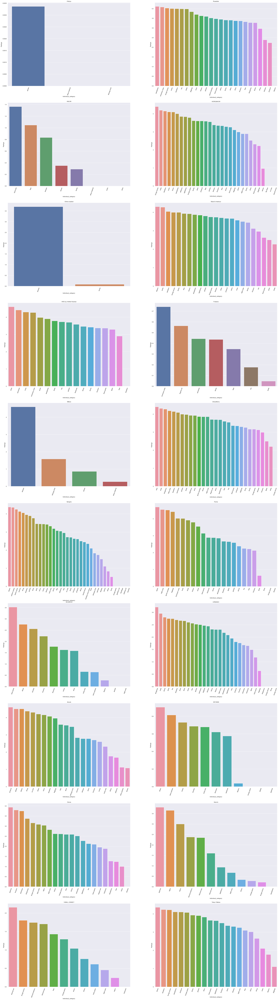

In [275]:
#Average ratings  of each Individual categories for first 20 companies having highest count
z=1
plt.figure(figsize=(40,150))
for i in c.BrandName:
    x=data[data.BrandName==i]
    y=x.groupby(['Individual_category'])['Ratings'].mean().sort_values(ascending=False).reset_index()
    plt.subplot(10,2,z)
    sns.set(rc={'figure.figsize':(10,10)})
    plt.title(i)
    sns.barplot(data=y,x='Individual_category',y='Ratings')
    plt.xticks(rotation=70)
    z+=1

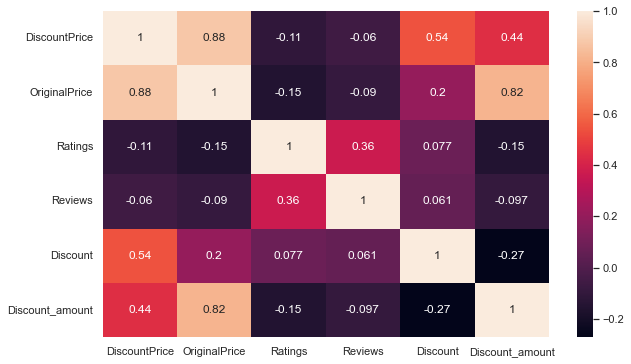

In [276]:
#To check correlation
plt.figure(figsize=(10,6))
c=data.corr()
sns.heatmap(c,annot=True);

1.Discount price and original price are highly positively correlated. if a product has higher pricing the chance of getting discount is more.

2.discount price and ratings are negatively correlated.ie,hike in discount price doesnt increase the rating of products

3.Ratings and Reviews have moderate positive linear relationship.